# Rhythm triangles

*Bas Cornelissen, August 8, 2022*

**Are rhythms in human music similarly organized as rhythms in the songs of songbirds? In a recent article Tina Roeske and colleagues conclude that *categorical rhythms are shared between songbirds and humans*. Their analysis makes use of an interesting type of plot they call the *rhythm raster plots*. In this notebook we look at these plots in more detail.**

**Data.** To run this notebook, you need to download the data from https://data.mendeley.com/datasets/s4cjj7h5sv/2 and https://data.mendeley.com/datasets/zhb728dc4z/1 and put it in a data/ directory

For data from De Gregorio et al, you have to contact the authors.

In [58]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.io
import ternary

plt.rcParams['font.sans-serif'] = ['Arial', 'HelveticaNeue', 'Helvetica']

In [59]:
save_pdf = True
save_png = True
def save(name):
    if save_pdf:
        plt.savefig(f'figures/{name}.pdf', transparent=True)
    if save_png:
        plt.savefig(f'figures/{name}.png', transparent=True, dpi=300)

## Load data

In [60]:
def drop_na(x):
    return x[np.logical_not(np.isnan(x))]

In [61]:
# We store all datasets in one object
DATA = {}

In [63]:
# Music corpora
corpora = [
    'CubanSalsa',
    'MalianJembe',
    'NorthIndianRaga',
    'PersianZarb',
    'PianoBach',
    'TunisianStambeli',
    'UruguayanCandombe'
]
for corpus in corpora:
    mat = scipy.io.loadmat(f'data/roeske/IntervalData_{corpus}_corpus.mat')
    DATA[corpus] = drop_na(mat[f'{corpus}_intervals_ms'][:,0])

In [17]:
# Birdsong
mat = scipy.io.loadmat('data/IntervalData_ThrushNightingale_3corpora.mat')
DATA['nightingale_songs'] = drop_na(mat['ThrushNightingaleSongs_intervals_ms'][:,0])
DATA['nightingale_stable'] = drop_na(mat['ThrushNightingaleStableRhythms_intervals_ms'][:, 0])
DATA['nightingale_same_syll'] = drop_na(mat['ThrushNightingaleSameSyllableEpochs_intervals_ms'][:, 0])

mat = scipy.io.loadmat('data/IntervalData_ZebraFinch_corpus.mat')
DATA['zebrafinch'] = drop_na(mat['ZebraFinch_intervals_ms'])

## Rhythm triangles

In [20]:
def get_motifs(intervals):
    """Get all motifs: sequences of three successive intervals, with normalized
    duration. The actual durations of the motifs are also returned."""
    triplets = np.asarray(list(zip(intervals[0:], intervals[1:], intervals[2:])))
    duration = triplets.sum(axis=1)
    motifs = triplets / duration[:, np.newaxis]
    return motifs, duration

In [21]:
motifs, duration = get_motifs(DATA['CubanSalsa'])

In [22]:
def subset(motifs, duration, min_dur=0, max_dur=np.inf, limit=-1, shuffle=True):
    """Select a subset of triplets (motifs): select only those motifs whose
    duration is between the minimum and maximum duration (min_dur, max_ddur),
    limit to a certain number of motifs, and optionally shuffle the motifs.
    """
    match = (duration > min_dur) & (duration < max_dur)
    index = np.arange(len(motifs))[match]
    if limit == -1 or limit > len(index):
        limit = len(index)
    if shuffle: 
        index = np.random.choice(index, size=limit, replace=False)
    else:
        index = index[:limit]
    return motifs[index, :], duration[index], index

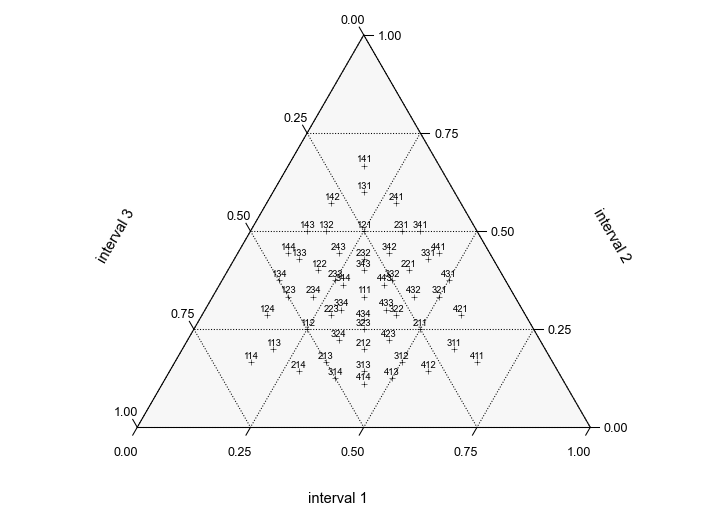

In [23]:
# Styling of rhythm plot
def setup_rhythm_plot(scale, subdiv=4, grid=False, grid_kws={}, label_offset=.05, ax=None):
    if ax is None: ax = plt.gca()
    kws = dict(linestyle=':')
    _grid_kws = dict(
        color='k', linewidth=0.5, 
        left_kwargs=kws, right_kwargs=kws, horizontal_kwargs=kws
    )
    _grid_kws.update(grid_kws)
    multiple = scale / subdiv

    figure, tax = ternary.figure(scale=scale, ax=ax)
    figure.dpi = 150
    ax.axis('equal')
    ax.set_axis_off()
    tax.boundary(linewidth=0.5)
    
    if grid:
        tax.gridlines(multiple=multiple, **_grid_kws)

    if subdiv > 1:
        ticks = [f'{x:.2f}' for x in np.linspace(0, 1, subdiv+1)]
        tax.ticks(axis='lbr', multiple=multiple, offset=.02, lw=0.5, ticks=ticks, fontsize=6)
        label_offset += 0.1
        
    tax.right_axis_label('interval 2', fontsize=7, offset=label_offset)
    tax.left_axis_label('interval 3', fontsize=7, offset=label_offset)
    tax.bottom_axis_label('interval 1', fontsize=7, offset=label_offset)
    return figure, tax

def show_integer_ratios(tax, scale, factors=[1, 2, 3], color='k'):
    from itertools import product
    
    points = dict()
    for a, b, c in product(factors, factors, factors):
        total = a + b + c
        point = (a/total, b/total, c/total)
        if point not in points.keys():
            points[point] = (a, b, c)

    for point, (a, b, c) in points.items():
        point = np.array(point) * scale
        tax.scatter([point], marker='+', s=8, color=color, linewidth=0.25)
        tax.annotate(f'{a}{b}{c}', point, color=color,
            ha='center', va='bottom', fontsize=4.5,
            xytext=(0, 1), textcoords='offset points')

fig, tax = setup_rhythm_plot(scale=60, subdiv=4, grid=True)
show_integer_ratios(tax, scale=60, factors=[1, 2, 3, 4])

### Scatter plots

In [28]:
# Color by cycle duration
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

def show_triangle_scatter(motifs, duration, 
        min_dur=0.15, max_dur=0.85, limit=30000, 
        scale=60, subdiv=1, ratios=True, ratios_kws={}, 
        s=1, alpha=.3,
        cmap='plasma_r', colorbar=True, vmin=None, vmax=None, ax=None,
        cbar_label='duration (ms)'
    ):
    if 0 <= min_dur <= 1: min_dur = np.quantile(duration, min_dur).astype(int)
    if 0 <= max_dur <= 1: max_dur = np.quantile(duration, max_dur).astype(int)
    if vmin is None: vmin = min_dur
    if vmax is None: vmax = max_dur

    norm = Normalize(vmin=vmin, vmax=vmax)
    x, dur, _ = subset(motifs, duration, min_dur=min_dur, max_dur=max_dur, limit=limit)
    fig, tax = setup_rhythm_plot(scale, subdiv, ax=ax)
    ax = tax.scatter(x*scale, s=s, alpha=alpha, c=dur, norm=norm, vmin=vmin, vmax=vmax, cmap=cmap, lw=0)
    if colorbar:
        fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), ax=ax, label=cbar_label)
    if ratios:
        show_integer_ratios(tax, scale, [1, 2, 3], **ratios_kws)
    return fig, tax

In [25]:
def show_dur_ranges(motifs, duration, start, end, step, name, **kwargs):
    for start in range(start, end, step):
        fig, tax = show_triangle_scatter(motifs, duration, min_dur=start, max_dur=start+step-1, **kwargs)
        tax.set_title(f'{name} (cycle duration {start}-{start+step-1}ms)')
        plt.show()
        yield fig, tax, start, start+step-1
    return

### Bird song

/Users/bas/repos/tmp/notebooks/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


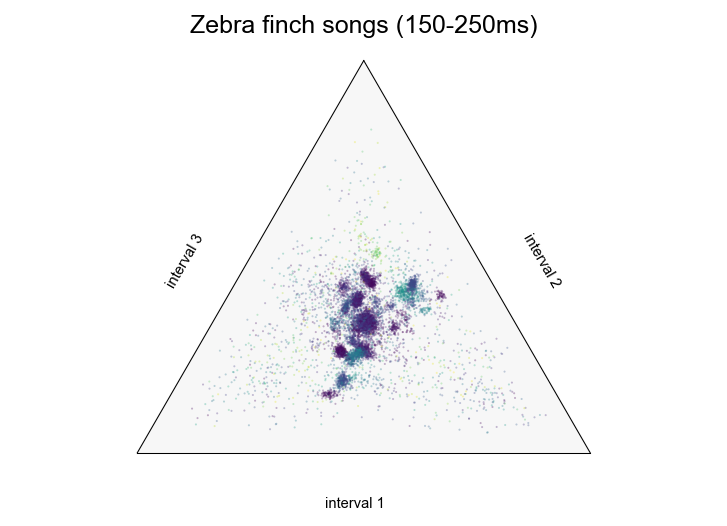

In [33]:
def plot_zebra_finch(min_dur, max_dur):
    motifs, duration = get_motifs(DATA['zebrafinch'])
    fig, tax = show_triangle_scatter(motifs, duration, 
        min_dur=min_dur, max_dur=max_dur, 
        ratios=False, cmap='viridis_r', colorbar=False)
    tax.set_title(f'Zebra finch songs ({min_dur}-{max_dur}ms)')
    save(f'triangle-plot-zebra-finch-songs-{min_dur}-{max_dur}ms')

plot_zebra_finch(150, 250)
plot_zebra_finch(250, 350)
plot_zebra_finch(350, 450)
plot_zebra_finch(450, 550)
plot_zebra_finch(550, 650)
plot_zebra_finch(650, 750)
plot_zebra_finch(750, 850)
plot_zebra_finch(850, 950)

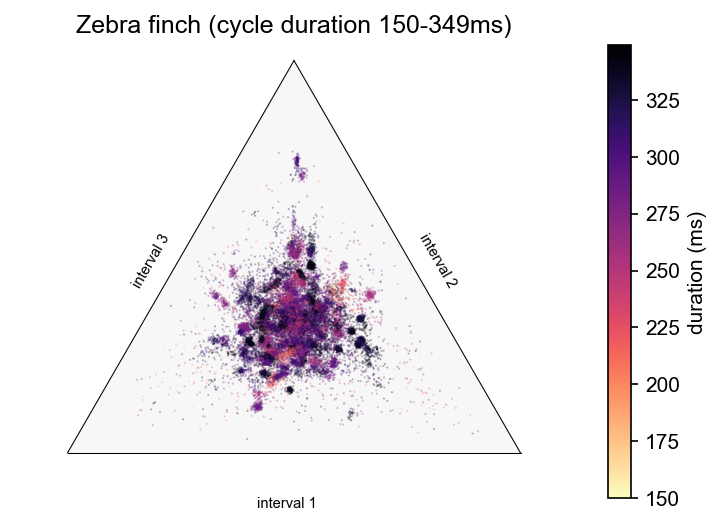

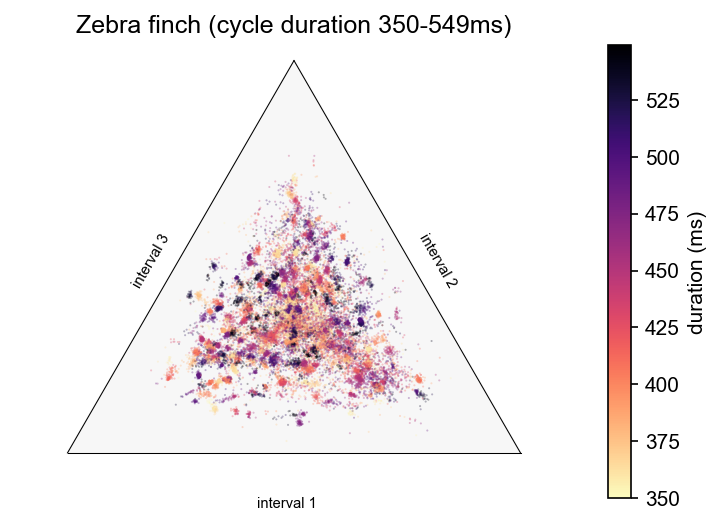

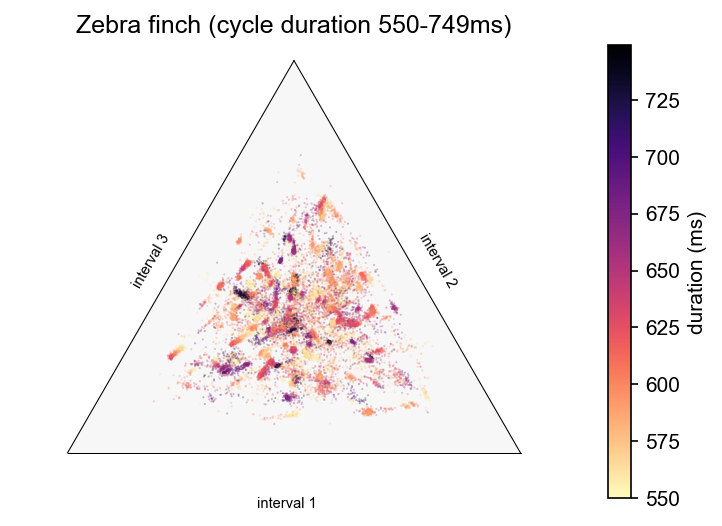

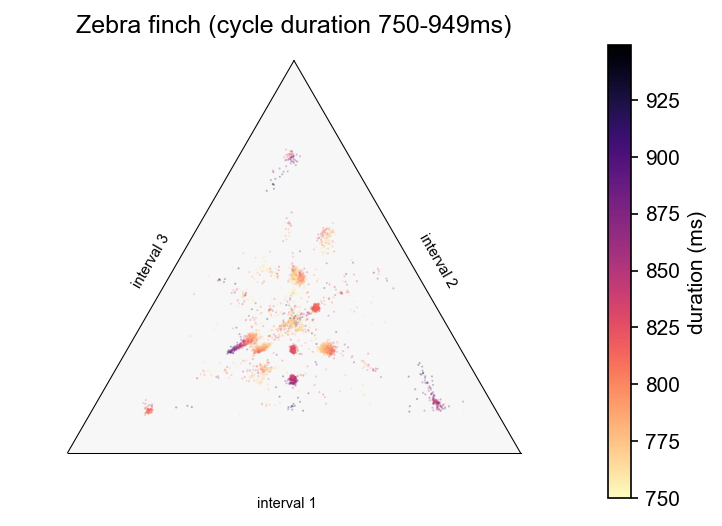

In [39]:
motifs, duration = get_motifs(DATA['zebrafinch'])
for _, _, start, end in show_dur_ranges(motifs, duration, 150, 950, 200, ratios=False, 
    name='Zebra finch', cmap='magma_r'):
    pass
    # save(f'triangle-plot-zebra-finch-{start}-{end}ms')

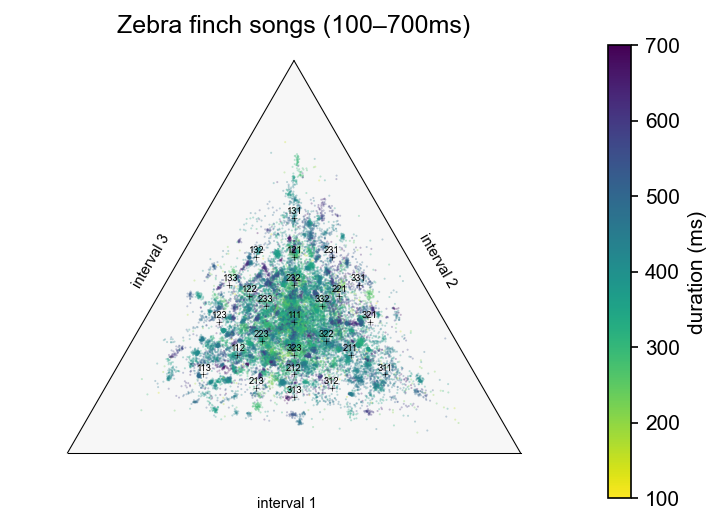

In [35]:
motifs, duration = get_motifs(DATA['zebrafinch'])
fig, tax = show_triangle_scatter(motifs, duration, min_dur=100, max_dur=700, cmap='viridis_r')
tax.set_title(f'Zebra finch songs (100–700ms)')
save(f'triangle-plot-zebra-finch-songs-100-700ms')

/Users/bas/repos/tmp/notebooks/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


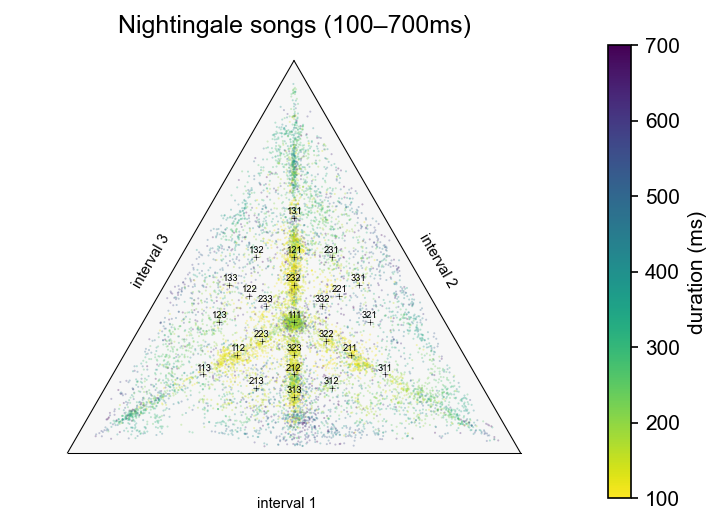

In [36]:
motifs, duration = get_motifs(DATA['nightingale_songs'])
fig, tax = show_triangle_scatter(motifs, duration, min_dur=100, max_dur=700, cmap='viridis_r')
tax.set_title(f'Nightingale songs (100–700ms)')
save(f'triangle-plot-nightingale-songs-100-700ms')

### Determine good cycle duration ranges for music

/Users/Bas/repos/posts/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


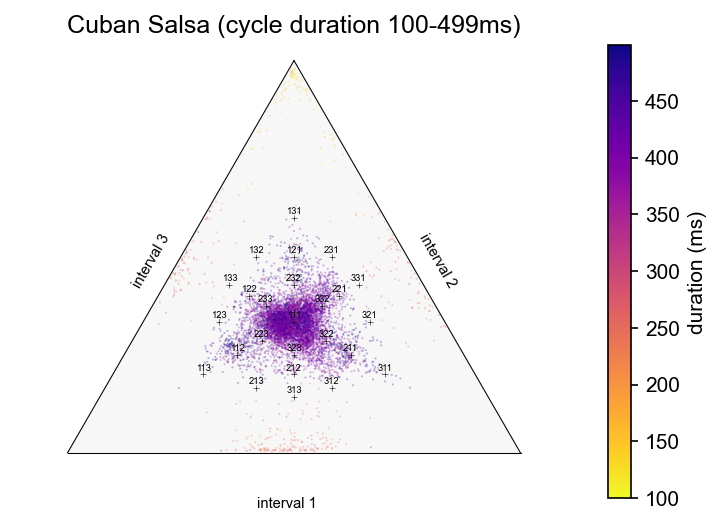

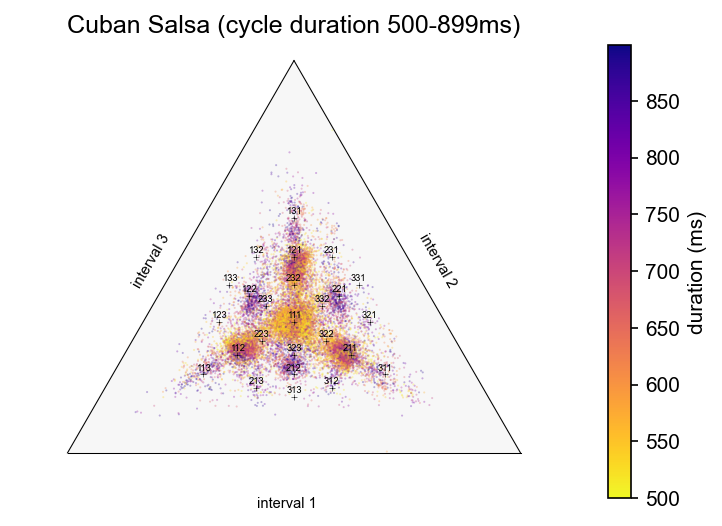

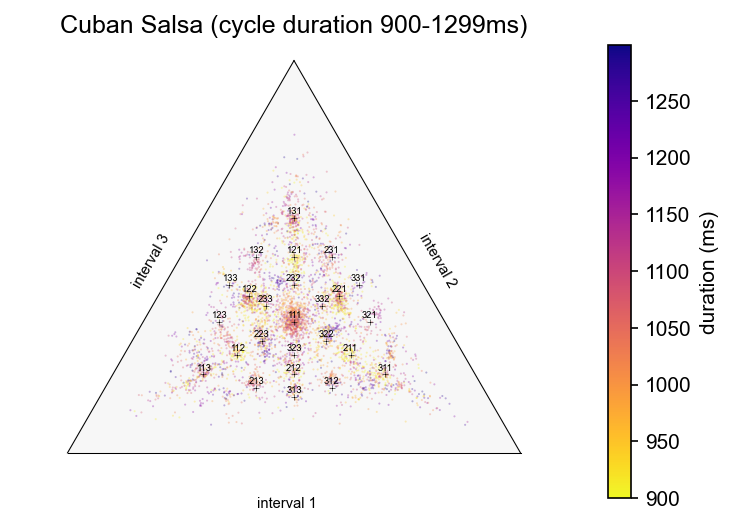

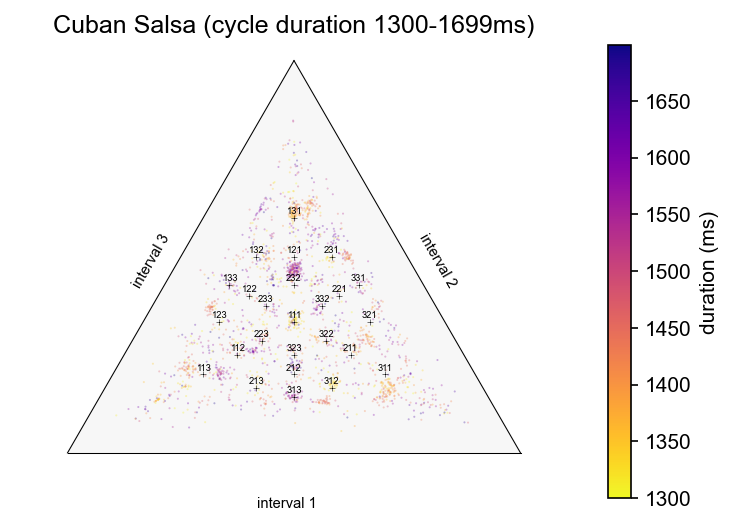

[]

In [229]:
motifs, duration = get_motifs(DATA['CubanSalsa'])
list(show_dur_ranges(motifs, duration, 100, 1700, 400, name='Cuban Salsa'));

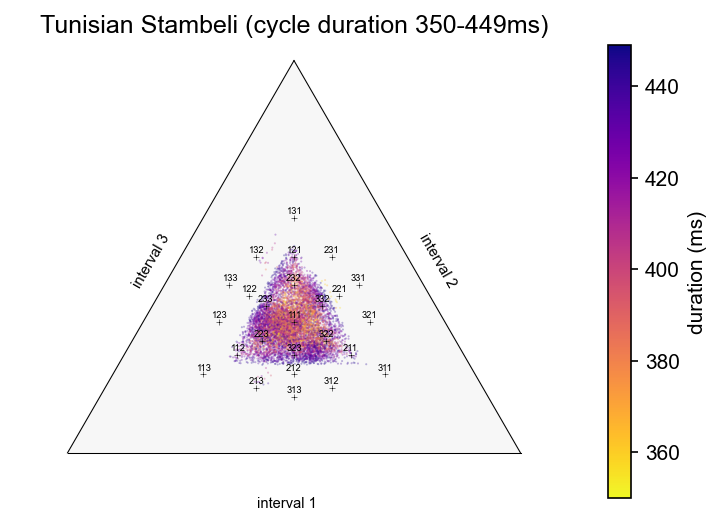

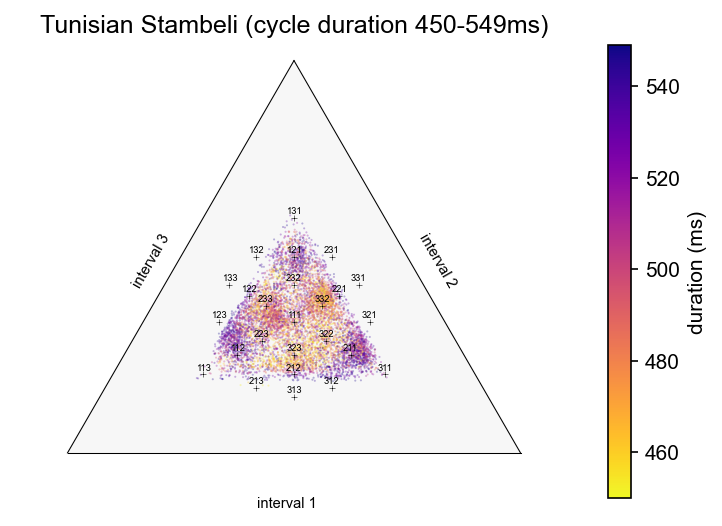

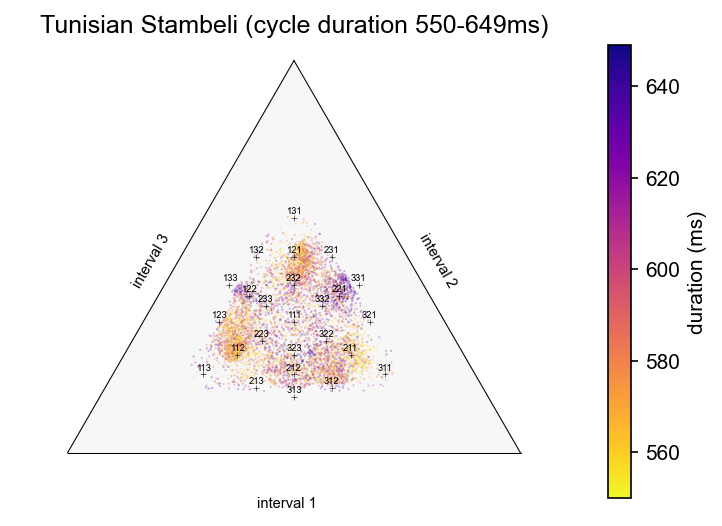

In [166]:
motifs, duration = get_motifs(DATA['TunisianStambeli'])
show_dur_ranges(motifs, duration, 350, 650, 100, name='Tunisian Stambeli')

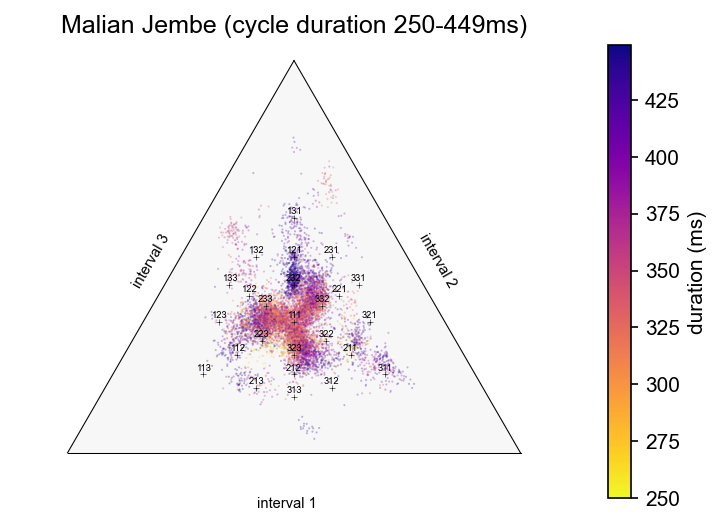

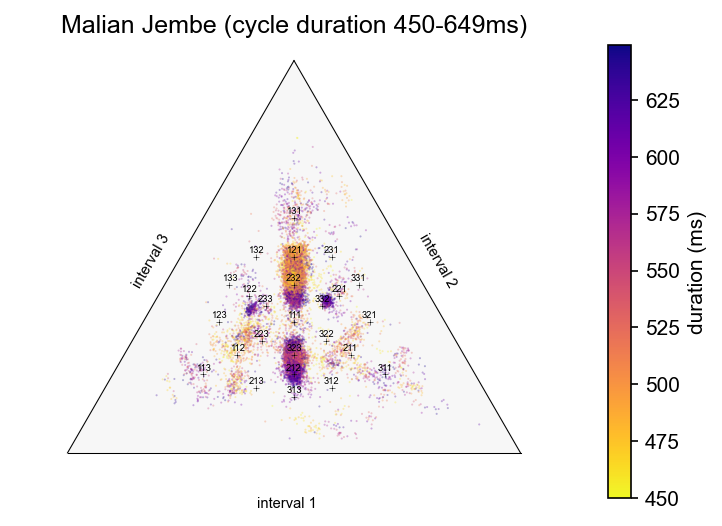

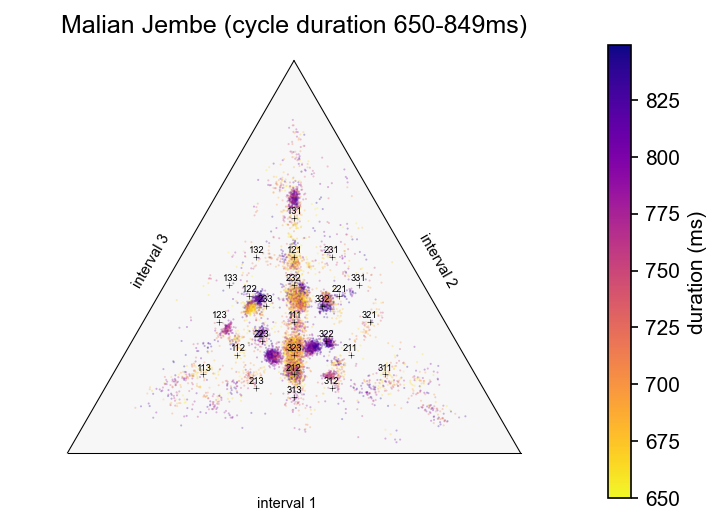

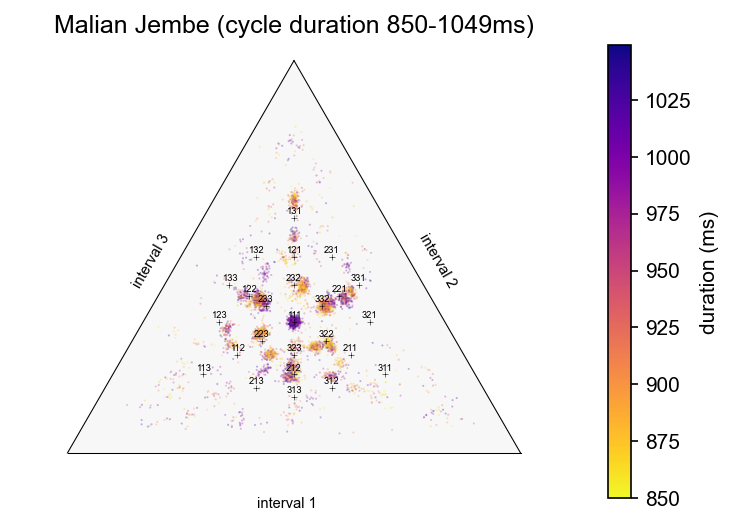

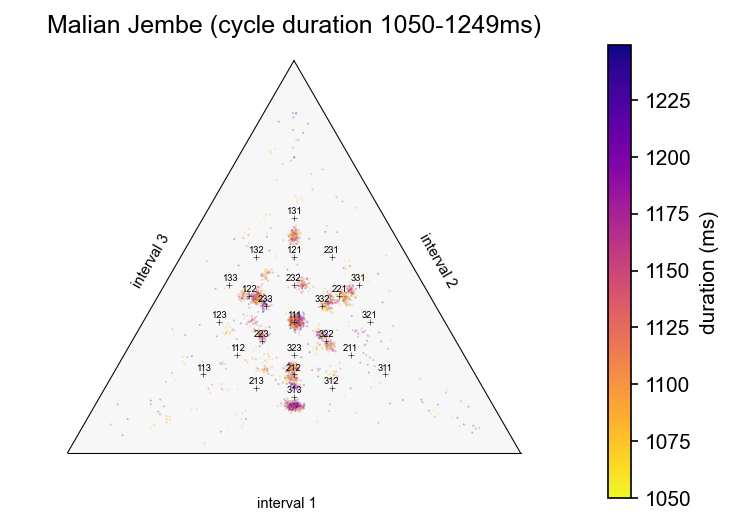

In [172]:
motifs, duration = get_motifs(DATA['MalianJembe'])
show_dur_ranges(motifs, duration, 250, 1250, 200, name='Malian Jembe')

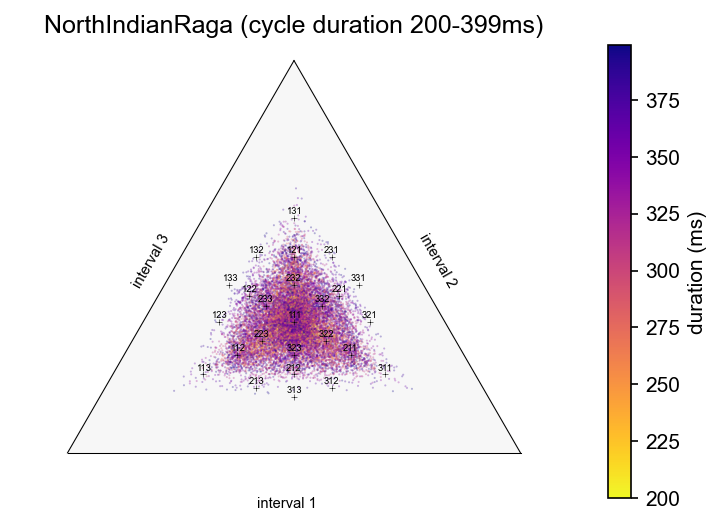

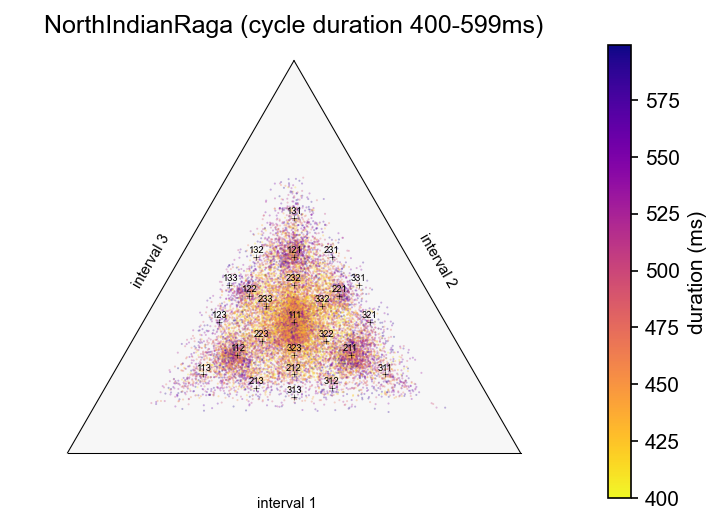

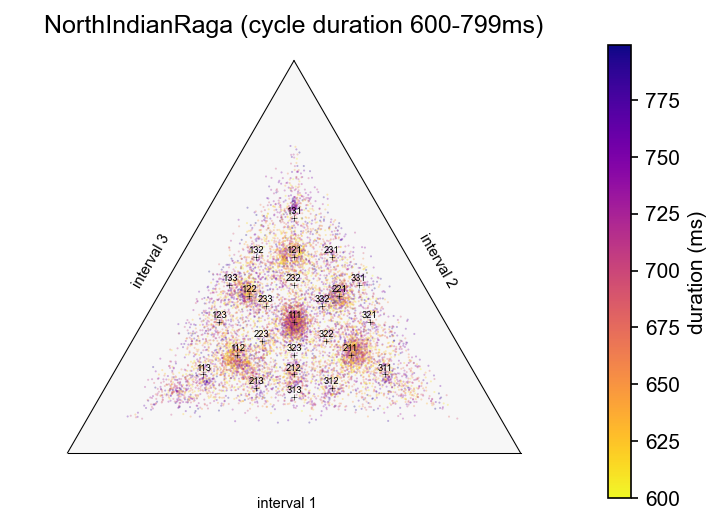

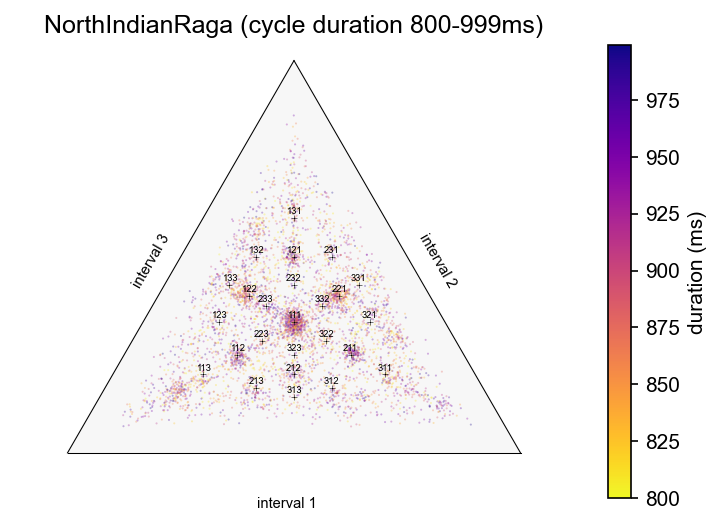

In [182]:
motifs, duration = get_motifs(DATA['NorthIndianRaga'])
show_dur_ranges(motifs, duration, 200, 1000, 200, name='NorthIndianRaga')

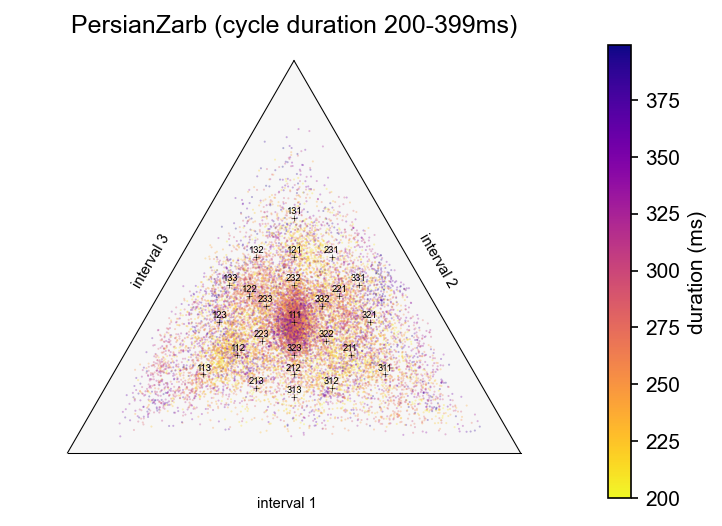

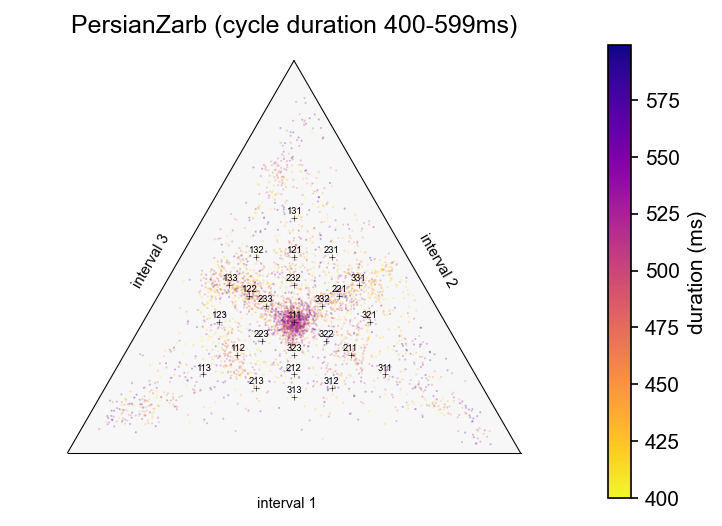

In [192]:
motifs, duration = get_motifs(DATA['PersianZarb'])
show_dur_ranges(motifs, duration, 200, 600, 200, name='PersianZarb')

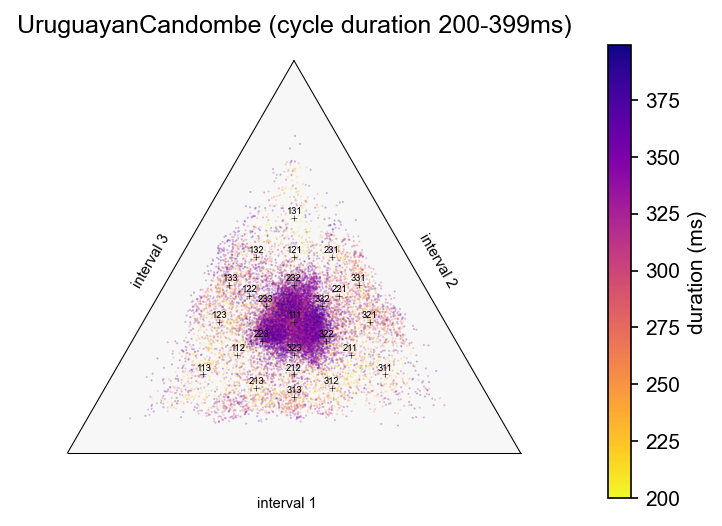

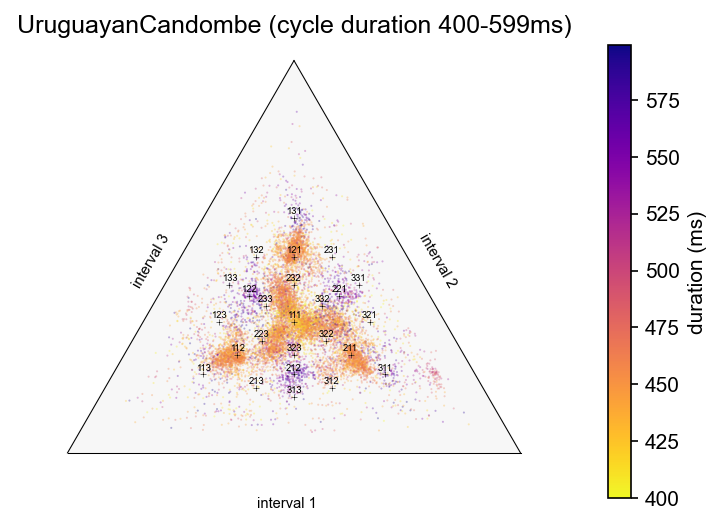

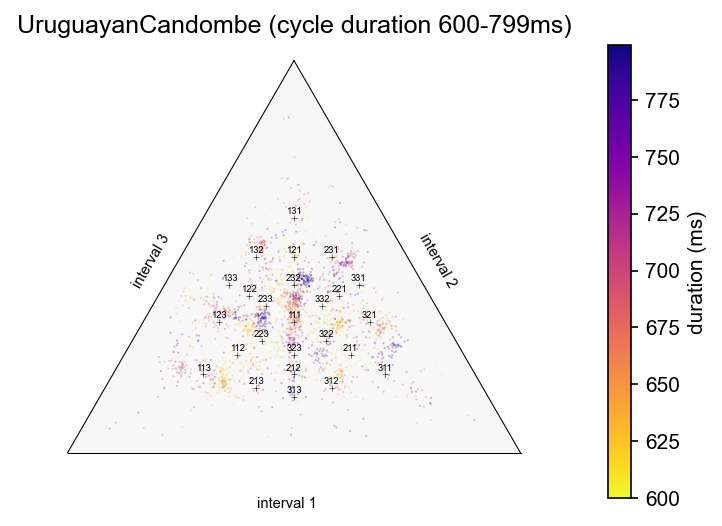

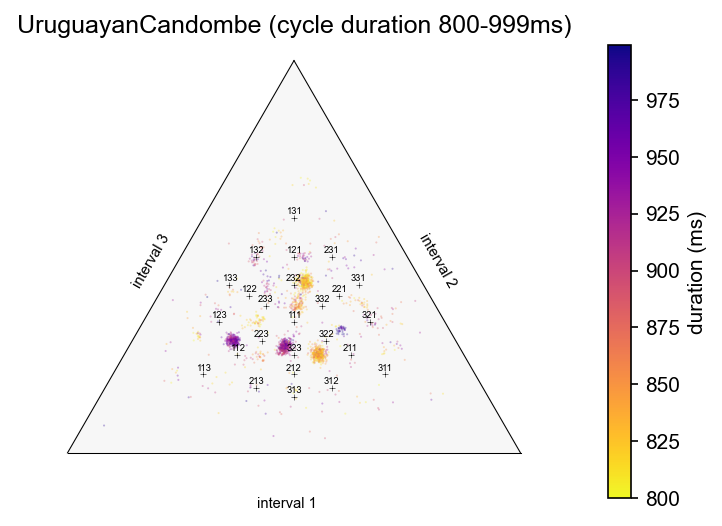

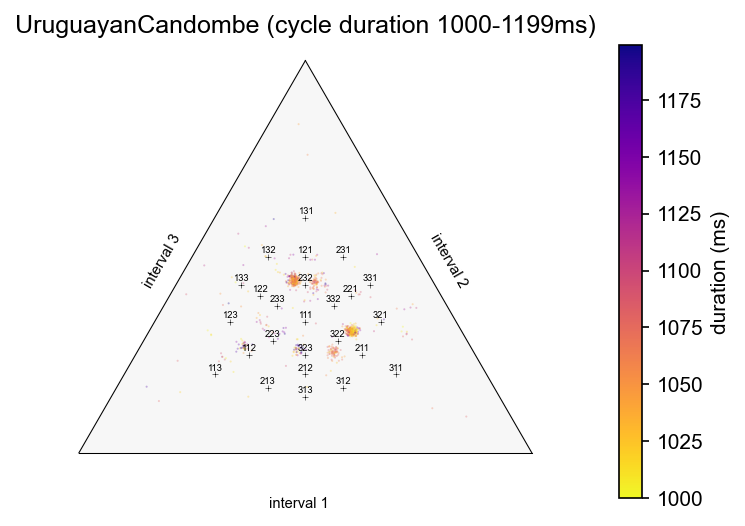

In [198]:
# motifs, duration = get_motifs(DATA['UruguayanCandombe'])
# show_dur_ranges(motifs, duration, 200, 1200, 200, name='UruguayanCandombe')

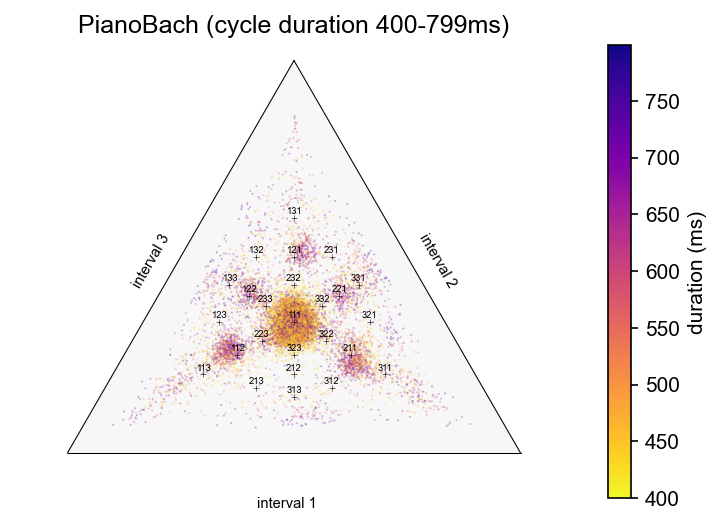

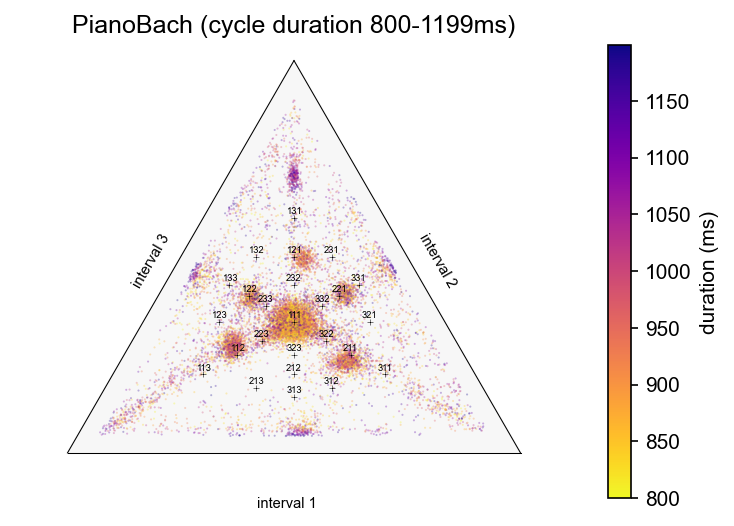

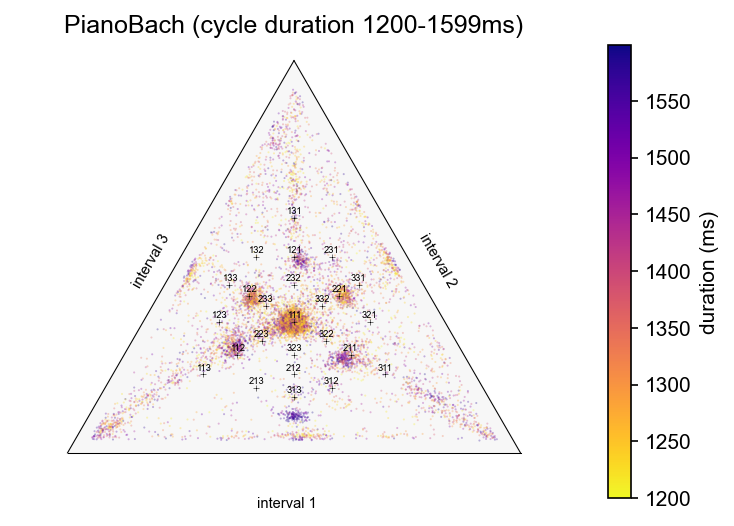

In [204]:
motifs, duration = get_motifs(DATA['PianoBach'])
show_dur_ranges(motifs, duration, 400, 1600, 400, name='PianoBach')

### Plot all traditions

In [237]:
cd_ranges = {
    'PianoBach': (400, 1600),
    'UruguayanCandombe': (400, 1200),
    'PersianZarb': (200, 600),
    'NorthIndianRaga': (400, 1000),
    'MalianJembe': (250, 1250),
    'TunisianStambeli': (350, 650),
    'CubanSalsa': (500, 1500),
}

/Users/Bas/repos/posts/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
/Users/Bas/repos/posts/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
/Users/Bas/repos/posts/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating i

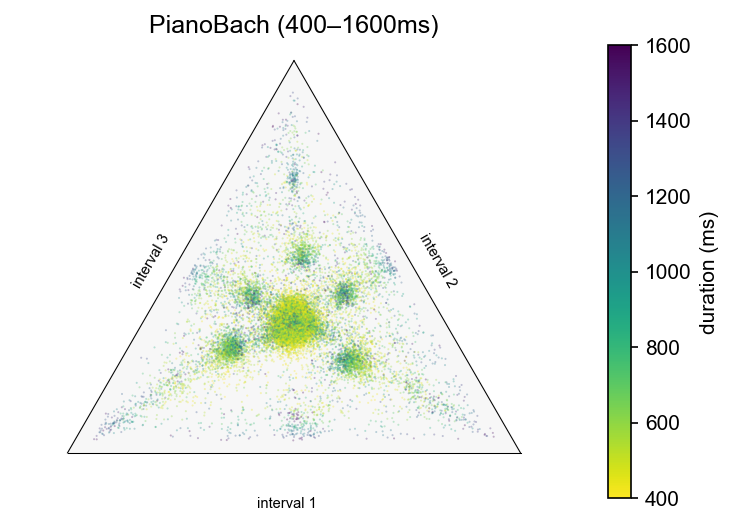

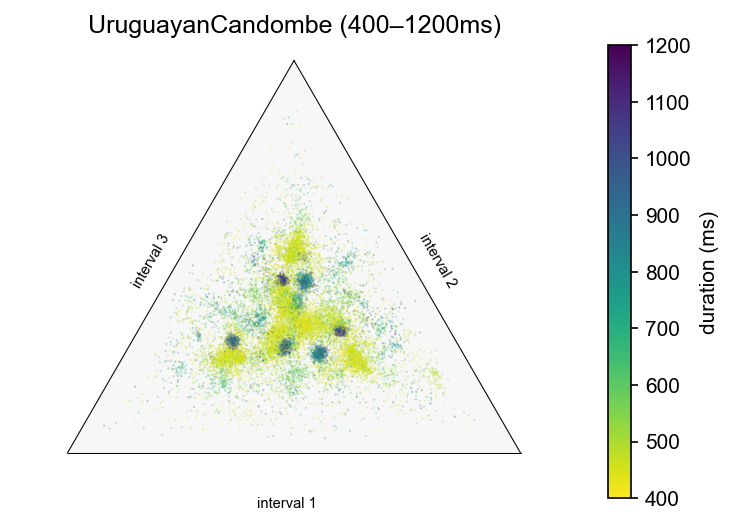

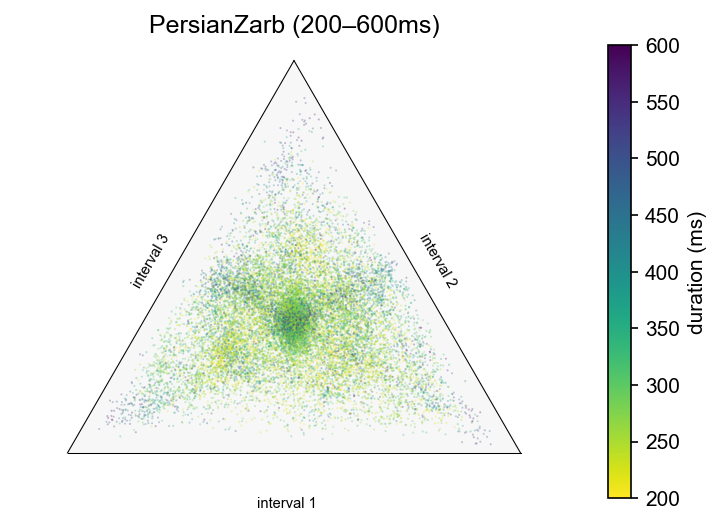

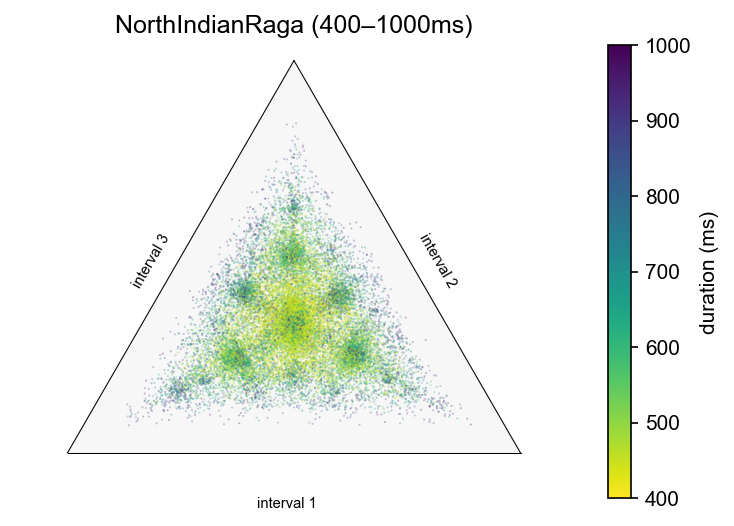

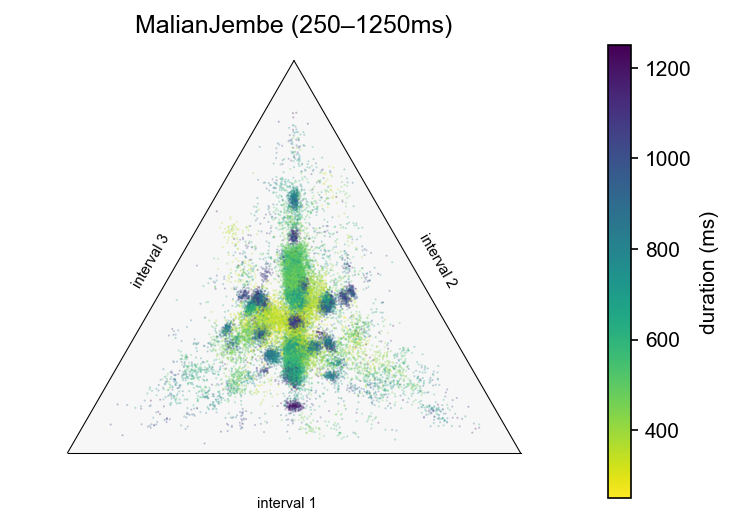

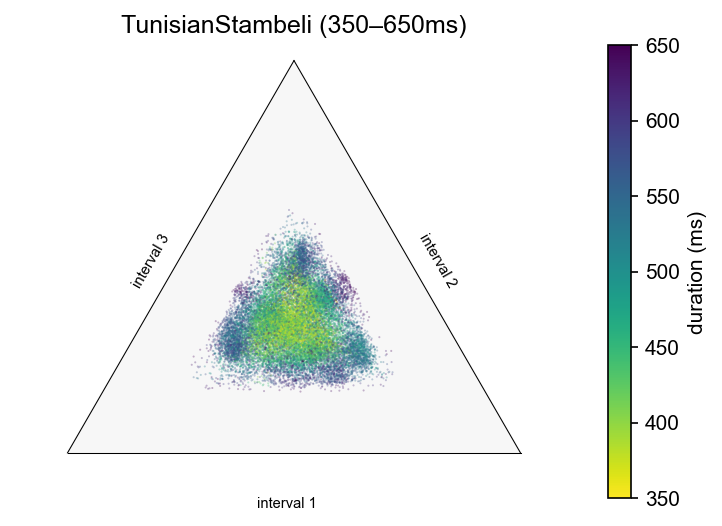

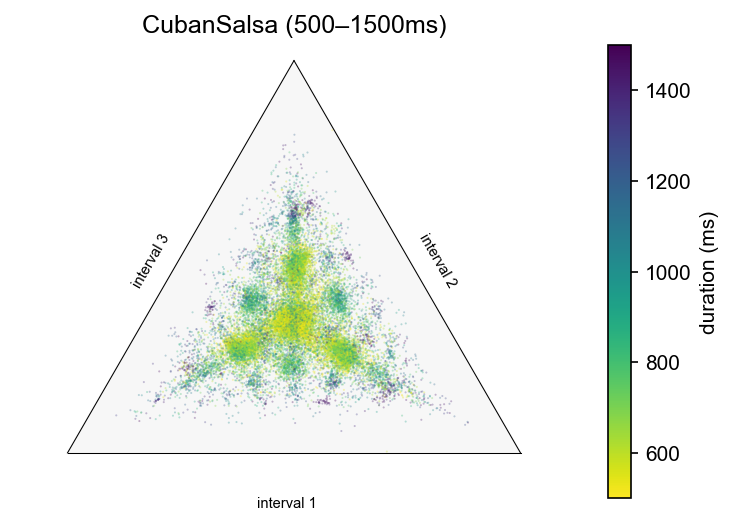

In [245]:
for corpus, (min_dur, max_dur) in cd_ranges.items():
    motifs, duration = get_motifs(DATA[corpus])
    fig, tax = show_triangle_scatter(motifs, duration, ratios=False, min_dur=min_dur, max_dur=max_dur, cmap='viridis_r')
    tax.set_title(f'{corpus} ({min_dur}–{max_dur}ms)')
    save(f'triangle-plot-{corpus}-manual-{min_dur}-{max_dur}ms')

/Users/Bas/repos/posts/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
/Users/Bas/repos/posts/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
/Users/Bas/repos/posts/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating i

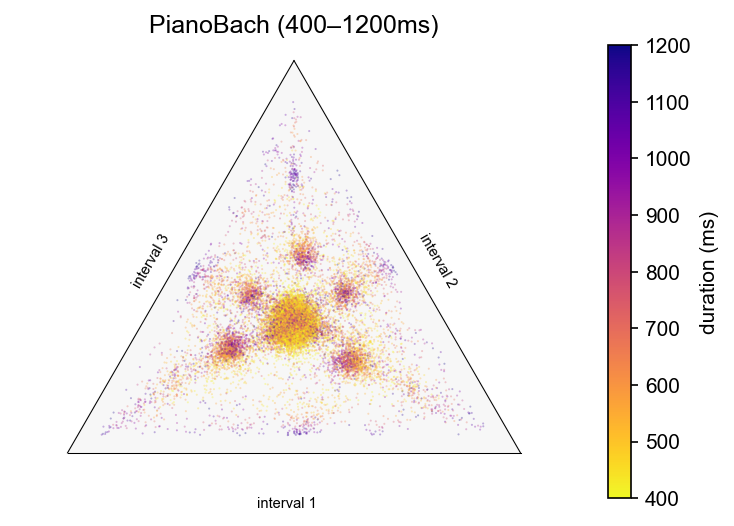

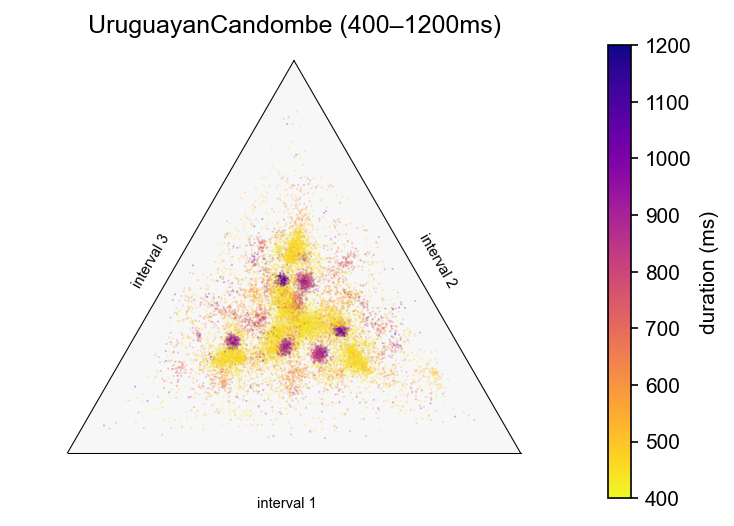

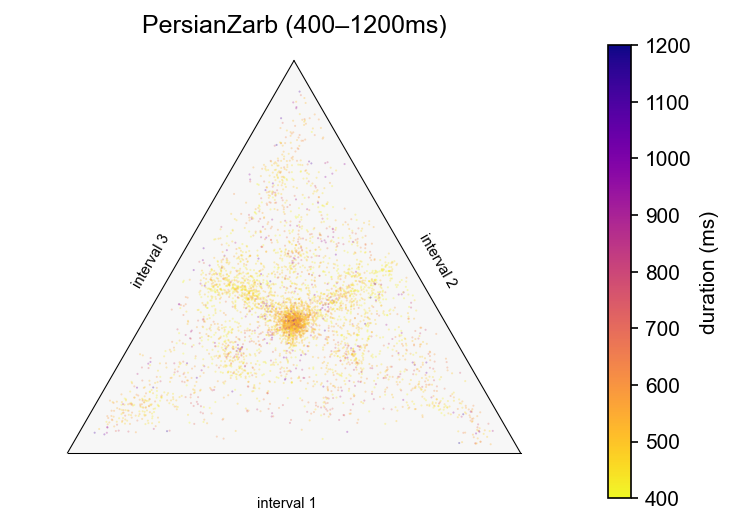

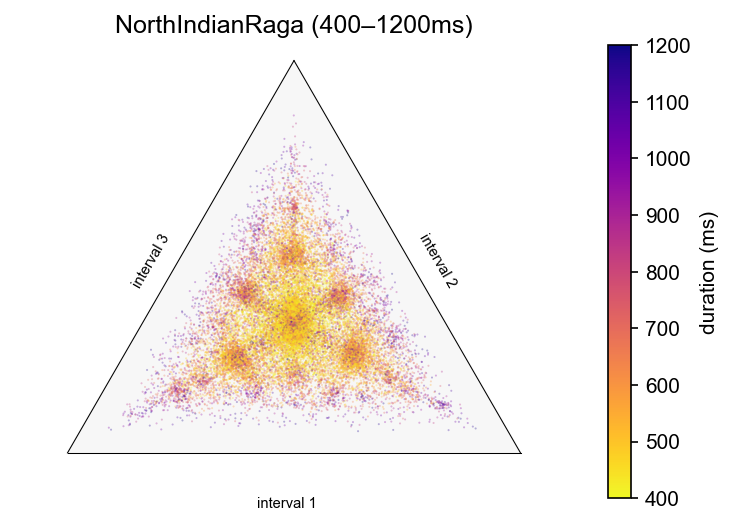

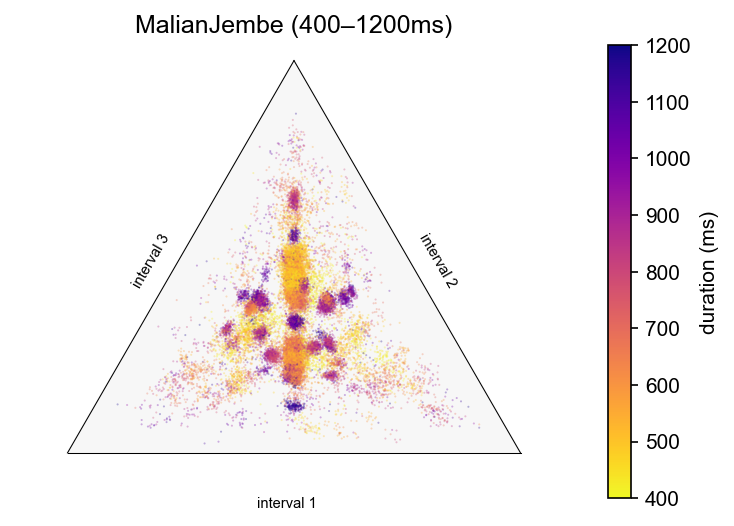

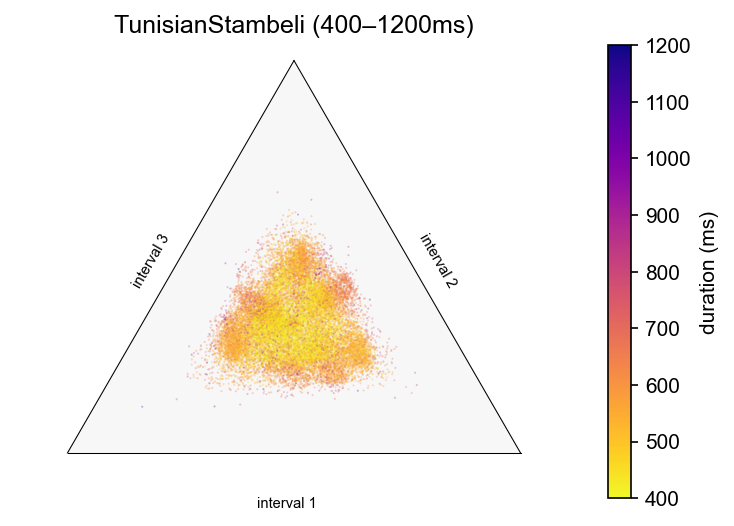

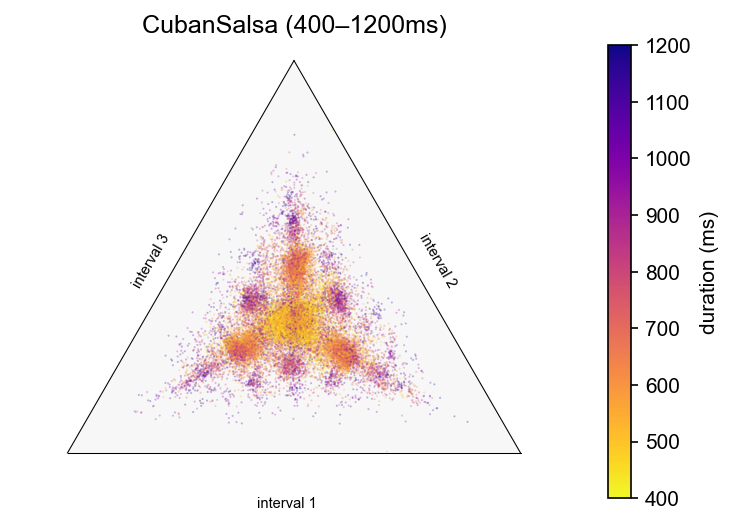

In [244]:
for corpus, (min_dur, max_dur) in cd_ranges.items():
    min_dur=400
    max_dur=1200
    motifs, duration = get_motifs(DATA[corpus])
    fig, tax = show_triangle_scatter(motifs, duration, ratios=False, min_dur=min_dur, max_dur=max_dur)
    tax.set_title(f'{corpus} ({min_dur}–{max_dur}ms)')
    save(f'triangle-plots-{corpus}-{min_dur}-{max_dur}ms')

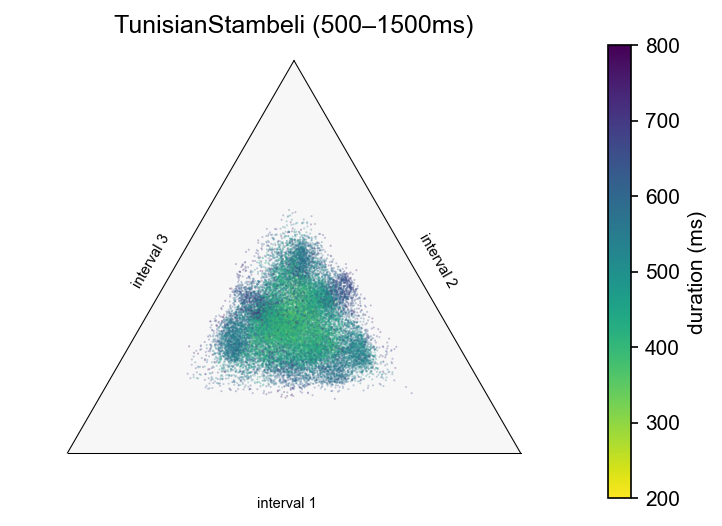

In [247]:
corpus='TunisianStambeli'
motifs, duration = get_motifs(DATA[corpus])
fig, tax = show_triangle_scatter(motifs, duration, ratios=False, min_dur=200, max_dur=800, cmap='viridis_r')
tax.set_title(f'{corpus} ({min_dur}–{max_dur}ms)')
# save(f'triangle-plots-{corpus}-manual-{min_dur}-{max_dur}ms')

### Higher-order organization: skipped rhythms

In [95]:
def skip_intervals(intervals, skip):
    positions = range(0, skip * len(intervals) // skip - 2, skip)
    return np.array([intervals[pos:pos+skip].sum() for pos in positions])

/Users/bas/repos/tmp/notebooks/env/lib/python3.7/site-packages/ternary/plotting.py:148: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


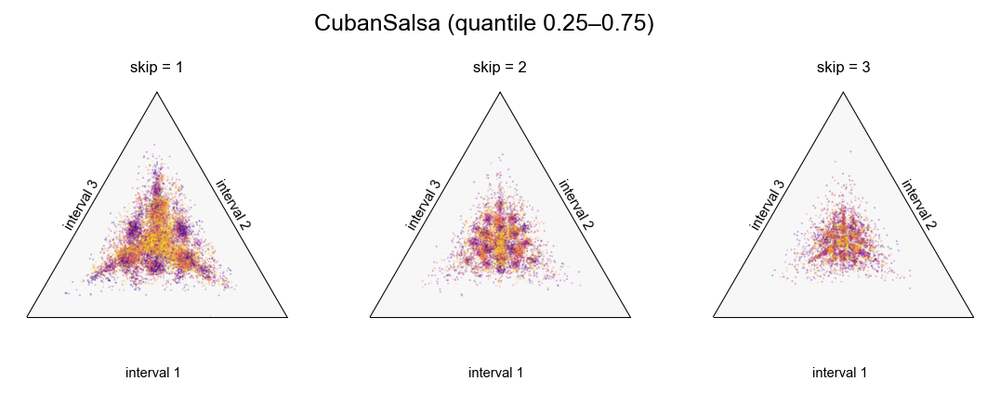

In [156]:
def show_skipped_intervals(corpus, skips=[1, 2, 3]):
    fig, axs = plt.subplots(1, len(skips), figsize=(3 * len(skips), 3))
    for ax, skip in zip(axs, skips):
        motifs, duration = get_motifs(skip_intervals(DATA[corpus], skip))
        fig, tax = show_triangle_scatter(motifs, duration, ratios=False, min_dur=0.25, max_dur=0.75, colorbar=False, ax=ax)
        ax.set_title(f'skip = {skip}', va='bottom', y=.9, fontsize=8)
    plt.suptitle(f'{corpus} (quantile 0.25–0.75)')

show_skipped_intervals('CubanSalsa')

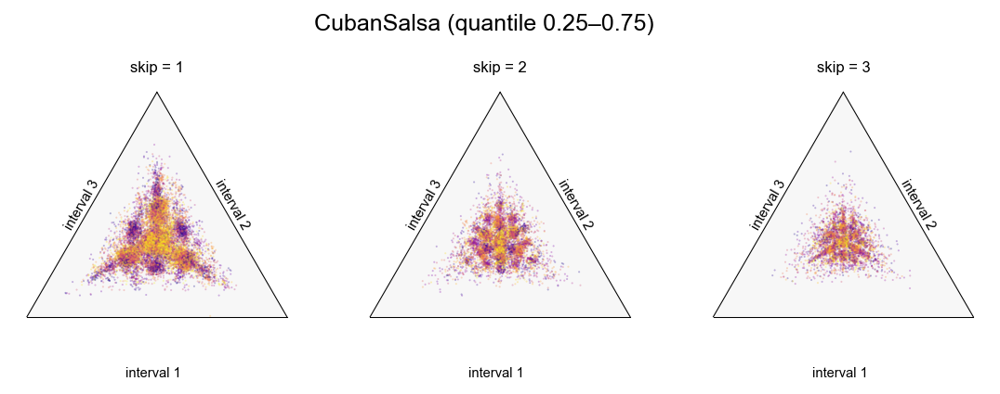

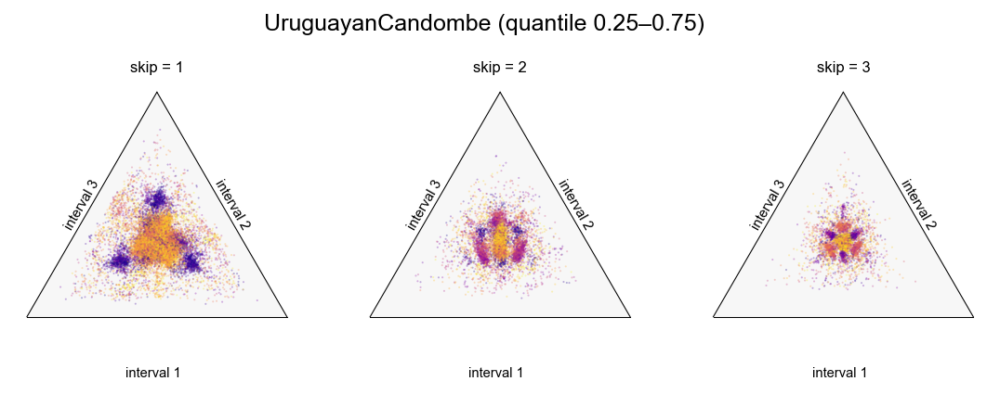

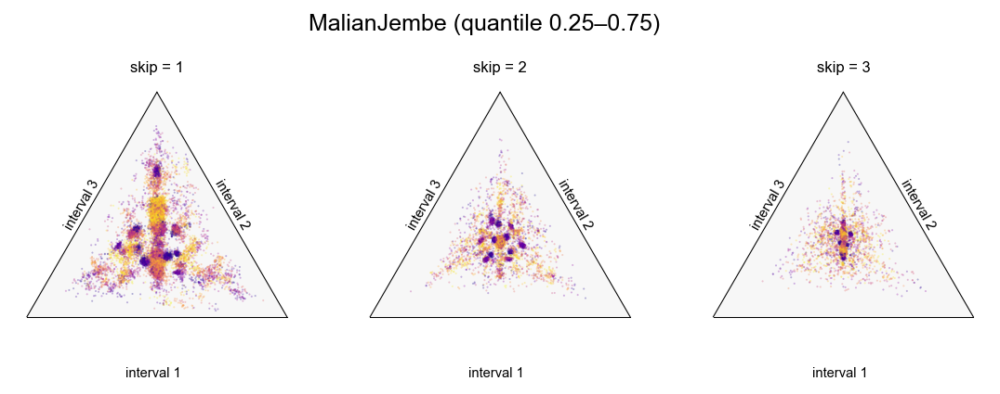

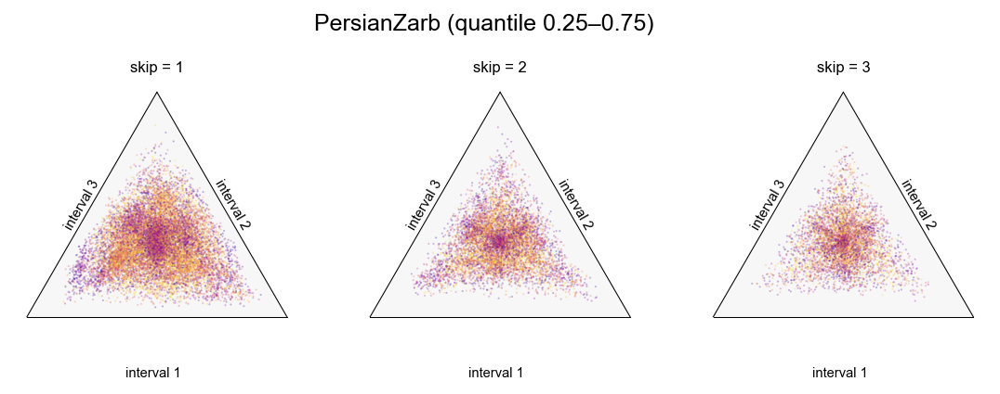

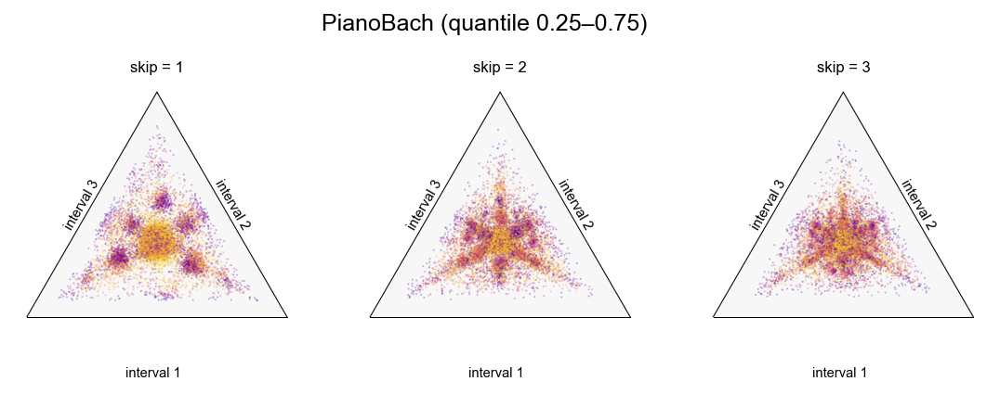

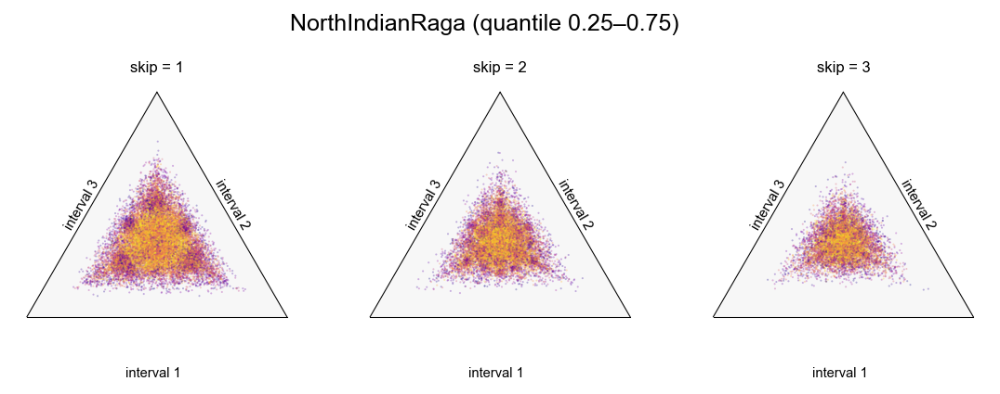

In [153]:
show_skipped_intervals('CubanSalsa')
show_skipped_intervals('UruguayanCandombe')
show_skipped_intervals('MalianJembe')
show_skipped_intervals('PersianZarb')
show_skipped_intervals('PianoBach')
show_skipped_intervals('NorthIndianRaga')

### Heatmaps

In [ ]:
def get_heatmap_data(triplets, scale=5, N=5000):
    from ternary.helpers import simplex_iterator
    from scipy.stats import gaussian_kde
    kde = gaussian_kde(triplets[:N, :2].T)
    data = dict()
    for (i, j, k) in simplex_iterator(scale):
        density = kde.pdf([i/scale, j/scale])[0]
        DATA[(i, j, scale-i-j)] = density
    return data

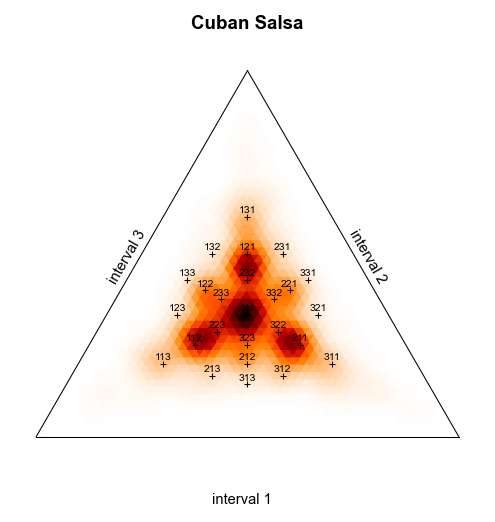

In [ ]:
def show_triangle_heatmap(motifs, scale=100, subdiv=4, cmap='gist_heat_r'):
    fig, tax = setup_rhythm_plot(scale, subdiv=subdiv)
    heatmap_data = get_heatmap_data(motifs, scale)
    tax.heatmap(heatmap_data, style="triangular", cmap=cmap, colorbar=False)
    show_integer_ratios(tax, scale, color='k', factors=[1, 2, 3])
    return fig, tax

motifs = get_motifs(DATA['CubanSalsa'])
_, tax = show_triangle_heatmap(motifs, scale=50, subdiv=1)
tax.set_title('Cuban Salsa', fontsize=9, fontweight='bold')

In [211]:
# for dataset in data.keys():
#     motifs = get_motifs(DATA[dataset])
#     _, tax = show_triangle_heatmap(motifs, scale=80, subdiv=1)
#     tax.set_title(dataset, fontsize=9, fontweight='bold')
#     save(f'triangle-plot-heatmap-{dataset}')